In [ ]:
#import models
import numpy as np
import sys, os
import rospy
import rosbag
import math
from scipy.interpolate import interp1d
import matplotlib.pylab as plt
import time 
from tqdm.auto import tqdm
import json

In [ ]:
possible_angle = [math.radians(9)]#[math.radians(3), math.radians(6), math.radians(9), math.radians(12)]
N_examples = 5
list_of_rotations = [[0, 0, 0]]

for i in range(1, N_examples):
    theta = [np.nan, 0, math.pi/6, math.pi/3, math.pi/2][i]#math.pi/2 #i * 2 * math.pi/(N_examples - 1)
    for phi in possible_angle:
        rx = phi * math.cos(theta)
        ry = phi * math.sin(theta)
        rotvec = [rx, ry, 0]
        list_of_rotations.append(rotvec)

print(len(list_of_rotations))
print(list_of_rotations)

cases_dict = {i+1: list_of_rotations[i][:2] for i in range(len(list_of_rotations))}
cases_dict[0] = [0, 0]
cases_dict

5
[[0, 0, 0], [0.15707963267948966, 0.0, 0], [0.13603495231756635, 0.07853981633974481, 0], [0.07853981633974484, 0.13603495231756632, 0], [9.618353468608949e-18, 0.15707963267948966, 0]]


{1: [0, 0],
 2: [0.15707963267948966, 0.0],
 3: [0.13603495231756635, 0.07853981633974481],
 4: [0.07853981633974484, 0.13603495231756632],
 5: [9.618353468608949e-18, 0.15707963267948966],
 0: [0, 0]}

array([[                164,                 186],
       [                 91,                  87],
       [1672825018735589141, 1672825018735594141],
       [                  1,                   1]])

In [ ]:
with open('data/small/contact_extraction5/samples.json', 'r') as f:
    samples = json.load(f)

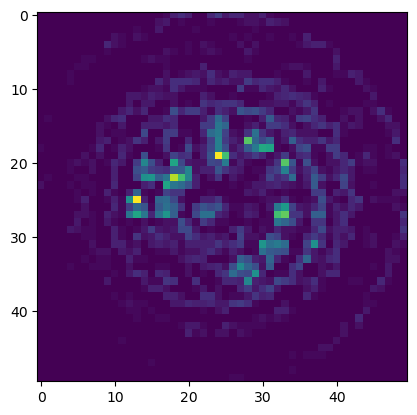

In [ ]:
np.histogram2d(np.array(samples['sample_1'][''])

In [ ]:
def rotate_case(ev_arr, label, angle):
    ev_arr = np.array(ev_arr)
    theta = np.radians(angle)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c, -s), (s, c)))
    
    centered = ev_arr[:, :2] - np.array([157, 124])
    rot_ev = (R @ centered.T).T + np.array([157, 124])
    
    rot_v = np.array(cases_dict[label])
    new_rot_v = R @ rot_v
    print(new_rot_v, cases_dict[label])

    best_rot_diff = 100
    best_rot_idx = 1
    i = 1
    
    for rot in list_of_rotations:
        diff_vals = np.sqrt( np.power(rot[0] - new_rot_v[0], 2) +  np.power(rot[1] - new_rot_v[1], 2))
        if best_rot_diff > diff_vals:
            best_rot_diff = diff_vals
            best_rot_idx = i
        i = i + 1
    return best_rot_idx, np.concatenate([rot_ev.astype(int), ev_arr[:, 2:]], -1)

In [ ]:
s_idx = 'sample_25'
ev_arr = np.array(samples[s_idx]['events'])
case = samples[s_idx]['case']
rot_case, rot = rotate_case(ev_arr, case, 90)
case, rot_case

[-0.07853982  0.13603495] [0.13603495231756635, 0.07853981633974481]


(3, 5)

In [ ]:
cases_dict

{1: [0, 0],
 2: [0.15707963267948966, 0.0],
 3: [0.13603495231756635, 0.07853981633974481],
 4: [0.07853981633974484, 0.13603495231756632],
 5: [9.618353468608949e-18, 0.15707963267948966],
 0: [0, 0]}

<AxesSubplot: >

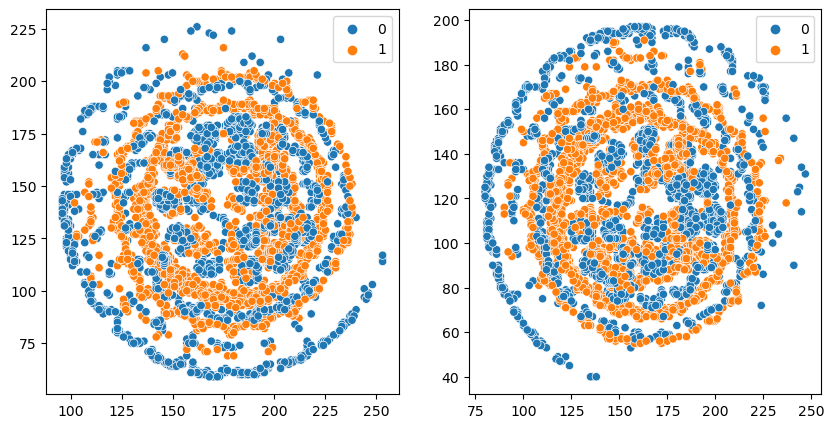

In [ ]:
import seaborn as sns
fig, axes = plt.subplots(1, 2, figsize=(2*5, 1*5))
plt.sca(axes[0])
sns.scatterplot(x=ev_arr[:, 0], y=260-ev_arr[:, 1], hue=ev_arr[:, 3])
plt.sca(axes[1])
sns.scatterplot(x=rot[:, 0], y=260-rot[:, 1], hue=rot[:, 3])

In [ ]:
rx, ry=cases_dict[case]

In [ ]:
phi = np.sqrt(rx**2+ry**2)
phi

0.15707963267948966

In [ ]:
theta = np.arctan2(ry, rx)
theta

0.5235987755982987

In [ ]:
rot_theta = theta + np.pi / 6
phi*np.cos(rot_theta), phi*np.sin(rot_theta)

(0.07853981633974488, 0.13603495231756632)

In [ ]:
np.degrees(0.5235987755982987)

29.999999999999993

In [ ]:
rot_case

4

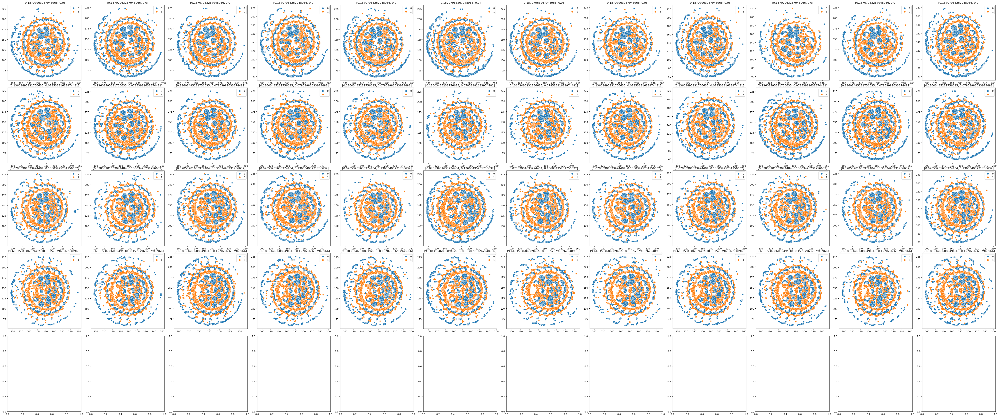

In [ ]:
import seaborn as sns
fig, axes = plt.subplots(5, 12, figsize=(12*5, 5*5))
plt.tight_layout()
for i, (ev_arr, ax) in enumerate(zip(event_arrays, axes.ravel())):
    plt.sca(ax)
    sns.scatterplot(x=ev_arr[:, 0], y=260-ev_arr[:, 1], hue=ev_arr[:, 3])
    plt.title(str(cases_dict[label_contact_case[i]]))

    
#plt.savefig('25ms_b4_75ms_after.png')
